In [78]:
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots



from sklearn.impute import SimpleImputer
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import StratifiedKFold, train_test_split


from lightgbm import LGBMClassifier
import lazypredict
from lazypredict.Supervised import LazyClassifier

import time
import warnings
warnings.filterwarnings('ignore')

In [79]:
data_train = pd.read_csv('D:/folder with projects on Python(ML)/train.csv')
data_test = pd.read_csv('D:/folder with projects on Python(ML)/test.csv')

Проедем EDA

In [80]:
data_train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.00,False,0.00,0.00,0.00,0.00,0.00,Maham Ofracculy,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.00,False,109.00,9.00,25.00,549.00,44.00,Juanna Vines,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.00,True,43.00,3576.00,0.00,6715.00,49.00,Altark Susent,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.00,False,0.00,1283.00,371.00,3329.00,193.00,Solam Susent,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.00,False,303.00,70.00,151.00,565.00,2.00,Willy Santantines,True


In [81]:
data_train.shape

(8693, 14)

In [82]:
data_test.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
0,0013_01,Earth,True,G/3/S,TRAPPIST-1e,27.00,False,0.00,0.00,0.00,0.00,0.00,Nelly Carsoning
1,0018_01,Earth,False,F/4/S,TRAPPIST-1e,19.00,False,0.00,9.00,0.00,2823.00,0.00,Lerome Peckers
2,0019_01,Europa,True,C/0/S,55 Cancri e,31.00,False,0.00,0.00,0.00,0.00,0.00,Sabih Unhearfus
3,0021_01,Europa,False,C/1/S,TRAPPIST-1e,38.00,False,0.00,6652.00,0.00,181.00,585.00,Meratz Caltilter
4,0023_01,Earth,False,F/5/S,TRAPPIST-1e,20.00,False,10.00,0.00,635.00,0.00,0.00,Brence Harperez


In [83]:
data_test.shape

(4277, 13)

In [84]:
data_train.describe(include='all')

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name,Transported
count,8693,8492,8476,8494,8511,8514.00,8490,8512.00,8510.00,8485.00,8510.00,8505.00,8493,8693
unique,8693,3,2,6560,3,NaN,2,NaN,NaN,NaN,NaN,NaN,8473,2
top,0001_01,Earth,False,G/734/S,TRAPPIST-1e,NaN,False,NaN,NaN,NaN,NaN,NaN,Gollux Reedall,True
freq,1,4602,5439,8,5915,NaN,8291,NaN,NaN,NaN,NaN,NaN,2,4378
mean,NaN,NaN,NaN,NaN,NaN,28.83,NaN,224.69,458.08,173.73,311.14,304.85,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,14.49,NaN,666.72,1611.49,604.70,1136.71,1145.72,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,0.00,NaN,0.00,0.00,0.00,0.00,0.00,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,19.00,NaN,0.00,0.00,0.00,0.00,0.00,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,27.00,NaN,0.00,0.00,0.00,0.00,0.00,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,38.00,NaN,47.00,76.00,27.00,59.00,46.00,NaN,NaN


In [85]:
data_test.describe(include='all')

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Name
count,4277,4190,4184,4177,4185,4186.00,4184,4195.00,4171.00,4179.00,4176.00,4197.00,4183
unique,4277,3,2,3265,3,NaN,2,NaN,NaN,NaN,NaN,NaN,4176
top,0013_01,Earth,False,G/160/P,TRAPPIST-1e,NaN,False,NaN,NaN,NaN,NaN,NaN,Cints Erle
freq,1,2263,2640,8,2956,NaN,4110,NaN,NaN,NaN,NaN,NaN,2
mean,NaN,NaN,NaN,NaN,NaN,28.66,NaN,219.27,439.48,177.30,303.05,310.71,NaN
std,NaN,NaN,NaN,NaN,NaN,14.18,NaN,607.01,1527.66,560.82,1117.19,1246.99,NaN
min,NaN,NaN,NaN,NaN,NaN,0.00,NaN,0.00,0.00,0.00,0.00,0.00,NaN
25%,NaN,NaN,NaN,NaN,NaN,19.00,NaN,0.00,0.00,0.00,0.00,0.00,NaN
50%,NaN,NaN,NaN,NaN,NaN,26.00,NaN,0.00,0.00,0.00,0.00,0.00,NaN
75%,NaN,NaN,NaN,NaN,NaN,37.00,NaN,53.00,78.00,33.00,50.00,36.00,NaN


In [86]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8693 entries, 0 to 8692
Data columns (total 14 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   PassengerId   8693 non-null   object 
 1   HomePlanet    8492 non-null   object 
 2   CryoSleep     8476 non-null   object 
 3   Cabin         8494 non-null   object 
 4   Destination   8511 non-null   object 
 5   Age           8514 non-null   float64
 6   VIP           8490 non-null   object 
 7   RoomService   8512 non-null   float64
 8   FoodCourt     8510 non-null   float64
 9   ShoppingMall  8485 non-null   float64
 10  Spa           8510 non-null   float64
 11  VRDeck        8505 non-null   float64
 12  Name          8493 non-null   object 
 13  Transported   8693 non-null   bool   
dtypes: bool(1), float64(6), object(7)
memory usage: 891.5+ KB


In [87]:
print(data_train.isnull().sum())

PassengerId       0
HomePlanet      201
CryoSleep       217
Cabin           199
Destination     182
Age             179
VIP             203
RoomService     181
FoodCourt       183
ShoppingMall    208
Spa             183
VRDeck          188
Name            200
Transported       0
dtype: int64


In [88]:
print(data_train.notnull().sum())

PassengerId     8693
HomePlanet      8492
CryoSleep       8476
Cabin           8494
Destination     8511
Age             8514
VIP             8490
RoomService     8512
FoodCourt       8510
ShoppingMall    8485
Spa             8510
VRDeck          8505
Name            8493
Transported     8693
dtype: int64


In [89]:
data_train = data_train.drop('Name', axis=1)
data_test = data_test.drop('Name', axis=1)

In [90]:
print('Number of rows in train data: ', data_train.shape[0])
print('Number of columns in train data: ', data_train.shape[1] + 1)
print(f'\033[94mNumber of values in train data: {data_train.count().sum()}')
print(f'\033[94mNumber missing values in train data: {sum(data_train.isna().sum())}')

Number of rows in train data:  8693
Number of columns in train data:  14
Number of values in train data: 110885
Number missing values in train data: 2124


In [91]:
print(f'\033[94mNumber of rows in test data: {data_test.shape[0]}')
print(f'\033[94mNumber of columns in test data: {data_test.shape[1] + 1}')
print(f'\033[94mNumber of values in train data: {data_test.count().sum()}')
print(f'\033[94mNo of rows with missing values  in test data: {sum(data_test.isna().sum())}')

Number of rows in test data: 4277
Number of columns in test data: 13
Number of values in train data: 50301
No of rows with missing values  in test data: 1023


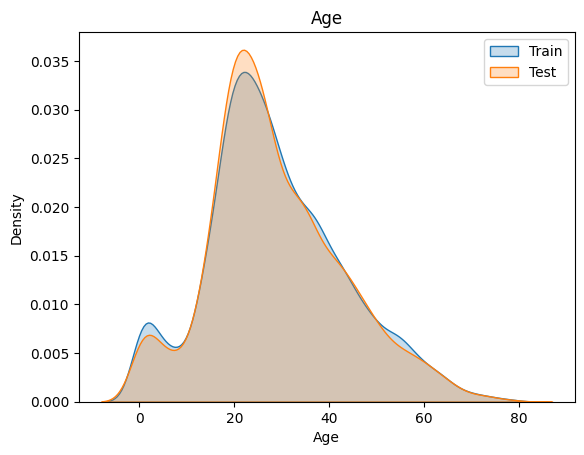

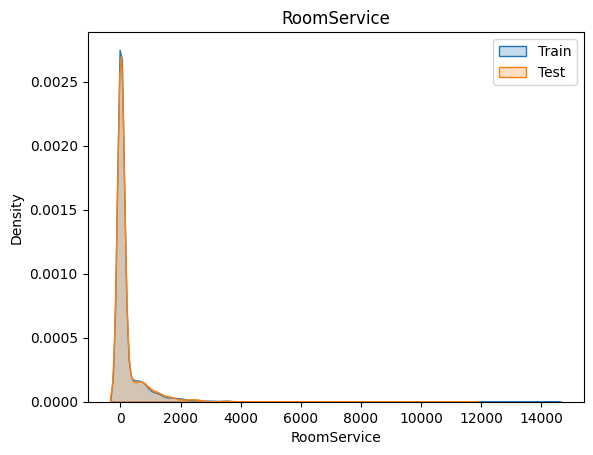

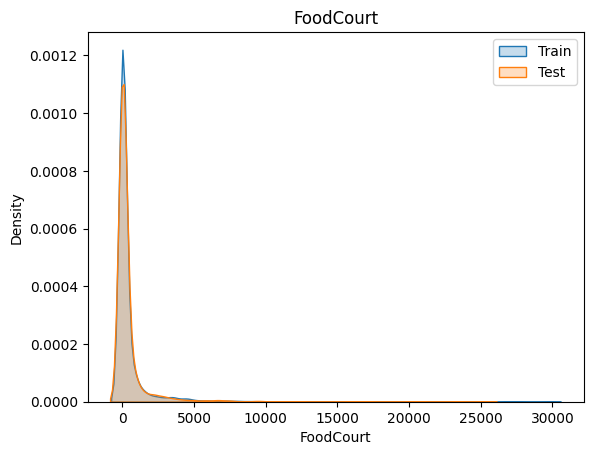

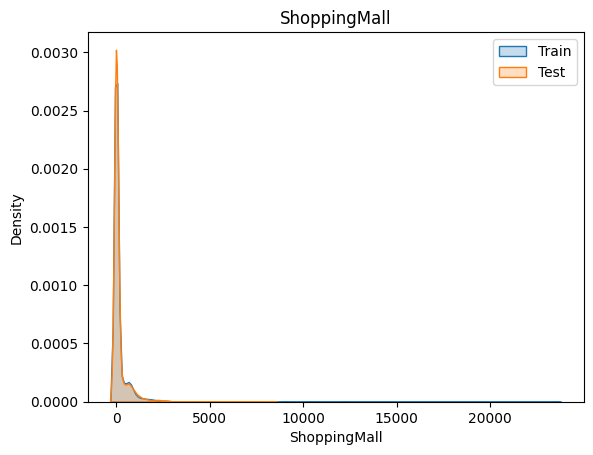

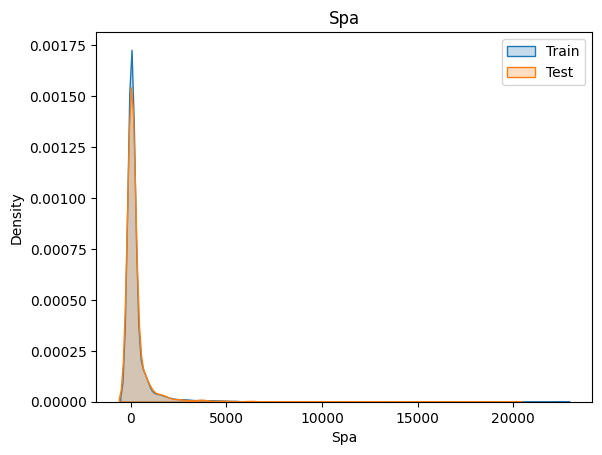

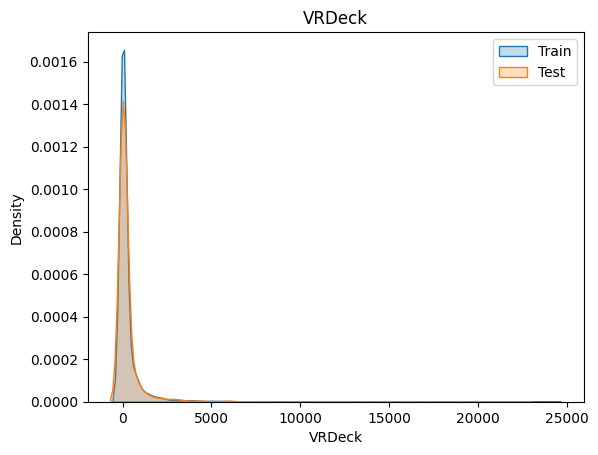

In [92]:
numerical_features = data_train.select_dtypes(include=["float64", "int64", 'bool']).columns
categorical_features = data_train.select_dtypes(include=["object"]).columns


for feature in numerical_features:
    if feature!='Transported':
        sns.kdeplot(data=data_train[feature], label='Train', shade=True)
        sns.kdeplot(data=data_test[feature], label='Test', shade=True)
        plt.title(feature)
        plt.legend()
        plt.show()

In [93]:
test_null = pd.DataFrame(data_test.isna().sum())
test_null = test_null.sort_values(by = 0 ,ascending = False)
train_null = pd.DataFrame(data_train.isna().sum())
train_null = train_null.sort_values(by = 0 ,ascending = False)[:-1]


fig = make_subplots(rows=1, 
                    cols=2,
                    column_titles = ["Train Data", "Test Data"] ,
                    x_title="Missing Values")


fig.add_trace(go.Bar(x=train_null[0],
                     y=train_null.index,
                     orientation="h",
                    marker=dict(color=[n for n in range(12)], 
                                line_color='rgb(0,0,0)' , 
                                line_width = 2,
                                coloraxis="coloraxis")),
              1, 1)
fig.add_trace(go.Bar(x=test_null[0], 
                     y=test_null.index,
                     orientation="h",
                    marker=dict(color=[n for n in range(12)], 
                                line_color='rgb(0,0,0)', 
                                line_width = 2,
                                coloraxis="coloraxis")),
              1, 2)
fig.update_layout(showlegend=False, title_text="Column wise Null Value Distribution", title_x=0.5)

In [94]:
labels = ['categorical_features','numerical_features']
values = [len(categorical_features), len(numerical_features)]
colors = ['#DE3163', '#58D68D']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, pull = [0.05,0],    marker=dict(colors=colors, line=dict(color='#000000', width=2)))])
fig.show()

In [95]:
labels = ['alive','dead']
values = [len(data_train['Transported'] == 'True'), len(data_train['Transported'] == 'False')]
colors = ['#F4D03F', '#3498DB']

fig = go.Figure(data = [go.Pie(labels = labels, values = values, pull = [0.05,0],    marker=dict(colors=colors, line=dict(color='#000000', width=2)))])
fig.show()

In [96]:
fig = make_subplots(rows=len(numerical_features), cols=1)

for i, cat in enumerate(numerical_features):
    fig.add_trace(go.Box(x=data_train['Transported'], y=data_train[cat], name=cat), row=i+1, col=1)

fig.update_layout(height=1000, width=800, title_text="Boxplots of Numerical Features")
fig.show()


In [97]:
train_age = data_train.copy()
test_age = data_test.copy()
train_age["type"] = "Train"
test_age["type"] = "Test"
ageDf = pd.concat([train_age, test_age])
for cat in ageDf.columns:
    fig = px.histogram(data_frame = ageDf, 
                    x=ageDf[cat],
                    color= "type",
                    color_discrete_sequence =  ['#58D68D','#DE3163'],
                    marginal="box",
                    nbins= 100,
                        template="plotly_white"
                    )
    fig.update_layout(title = "Distribution of params" , title_x = 0.5)
    fig.show()

In [98]:
fig = px.imshow(data_train.corr(),text_auto='True',aspect='auto',color_continuous_scale='viridis')
fig.show()

In [99]:
fig = px.scatter(data_frame = data_train, x = 'PassengerId', y = 'Cabin',color='Transported')
fig.show()

In [100]:
# fig = px.scatter(data_frame=data_train, x = 'Age', y = 'VIP', title='Dependency between Age and Vip')
# fig.show()
fig = px.box(data_frame=data_train, x='Age', y='VIP', color='Transported')
fig.show()

In [101]:
fig = px.scatter_matrix(data_test, dimensions=[])

In [102]:
fig = px.histogram(data_frame=data_train, 
                   x='Cabin',
                   color='Transported',
                   barmode='group',
                   template='plotly_white',
                   title='Dependence of Transported on Cabin')
fig.show()


Data Pre-Processing

In [103]:
fig = px.scatter_matrix(data_train, dimensions=['PassengerId','CryoSleep','Cabin','Destination','Age','VIP'], color="Transported")
fig.show()

In [104]:

data_train['HomePlanet'] = data_train['HomePlanet'].fillna(data_train['HomePlanet'].mode()[0])
data_train['CryoSleep'] = data_train['CryoSleep'].fillna(data_train['CryoSleep'].mode()[0])
data_train['Cabin'] = data_train['Cabin'].fillna(data_train['Cabin'].mode()[0])
data_train['Age'] = data_train['Age'].fillna(data_train['Age'].mean())
data_train['VIP'] = data_train['VIP'].fillna(data_train['VIP'].mode()[0])
data_train['RoomService'] = data_train['RoomService'].fillna(data_train['RoomService'].mode()[0])
data_train['FoodCourt'] = data_train['FoodCourt'].fillna(data_train['FoodCourt'].mode()[0])
data_train['Spa'] = data_train['Spa'].fillna(data_train['Spa'].mode()[0])
data_train['VRDeck'] = data_train['VRDeck'].fillna(data_train['VRDeck'].mode()[0])



data_test['HomePlanet'] = data_test['HomePlanet'].fillna(data_test['HomePlanet'].mode()[0])
data_test['CryoSleep'] = data_test['CryoSleep'].fillna(data_test['CryoSleep'].mode()[0])
data_test['Cabin'] = data_test['Cabin'].fillna(data_test['Cabin'].mode()[0])
data_test['Age'] = data_test['Age'].fillna(data_test['Age'].mean())
data_test['VIP'] = data_test['VIP'].fillna(data_test['VIP'].mode()[0])
data_test['RoomService'] = data_test['RoomService'].fillna(data_test['RoomService'].mode()[0])
data_test['FoodCourt'] = data_test['FoodCourt'].fillna(data_test['FoodCourt'].mode()[0])
data_test['Spa'] = data_test['Spa'].fillna(data_test['Spa'].mode()[0])
data_test['VRDeck'] = data_test['VRDeck'].fillna(data_test['VRDeck'].mode()[0])


In [105]:
data_test['ShoppingMall'] = data_test['ShoppingMall'].fillna(data_test['ShoppingMall'].mode()[0])
data_test['Destination'] = data_test['Destination'].fillna(data_test['Destination'].mode()[0])
data_train['ShoppingMall'] = data_train['ShoppingMall'].fillna(data_train['ShoppingMall'].mode()[0])
data_train['Destination'] = data_train['Destination'].fillna(data_train['Destination'].mode()[0])

In [106]:
data_train.isnull().sum()

PassengerId     0
HomePlanet      0
CryoSleep       0
Cabin           0
Destination     0
Age             0
VIP             0
RoomService     0
FoodCourt       0
ShoppingMall    0
Spa             0
VRDeck          0
Transported     0
dtype: int64

In [107]:
print(data_train.corr())

              CryoSleep   Age   VIP  RoomService  FoodCourt  ShoppingMall  \
CryoSleep          1.00 -0.07 -0.08        -0.24      -0.21         -0.21   
Age               -0.07  1.00  0.09         0.07       0.13          0.03   
VIP               -0.08  0.09  1.00         0.06       0.13          0.02   
RoomService       -0.24  0.07  0.06         1.00      -0.02          0.05   
FoodCourt         -0.21  0.13  0.13        -0.02       1.00         -0.01   
ShoppingMall      -0.21  0.03  0.02         0.05      -0.01          1.00   
Spa               -0.20  0.12  0.06         0.01       0.22          0.01   
VRDeck            -0.19  0.10  0.12        -0.02       0.22         -0.01   
Transported        0.46 -0.07 -0.04        -0.24       0.05          0.01   

               Spa  VRDeck  Transported  
CryoSleep    -0.20   -0.19         0.46  
Age           0.12    0.10        -0.07  
VIP           0.06    0.12        -0.04  
RoomService   0.01   -0.02        -0.24  
FoodCourt     0.22 

In [108]:
data_train.head()

,PassengerId,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,0001_01,Europa,False,B/0/P,TRAPPIST-1e,39.00,False,0.00,0.00,0.00,0.00,0.00,False
1,0002_01,Earth,False,F/0/S,TRAPPIST-1e,24.00,False,109.00,9.00,25.00,549.00,44.00,True
2,0003_01,Europa,False,A/0/S,TRAPPIST-1e,58.00,True,43.00,3576.00,0.00,6715.00,49.00,False
3,0003_02,Europa,False,A/0/S,TRAPPIST-1e,33.00,False,0.00,1283.00,371.00,3329.00,193.00,False
4,0004_01,Earth,False,F/1/S,TRAPPIST-1e,16.00,False,303.00,70.00,151.00,565.00,2.00,True


In [109]:
data_train = data_train.drop('PassengerId', axis=1)
data_test = data_test.drop('PassengerId', axis=1)




In [110]:
cat_cols = data_train.select_dtypes(include='object').columns

print(cat_cols)

Index(['HomePlanet', 'Cabin', 'Destination'], dtype='object')


In [111]:
def label_encoder(data_train,data_test,columns):
    for col in columns:
        data_train[col] = data_train[col].astype(str)
        data_test[col] = data_test[col].astype(str)
        data_train[col] = LabelEncoder().fit_transform(data_train[col])
        data_test[col] =  LabelEncoder().fit_transform(data_test[col])
    return data_train, data_test

data_train ,data_test = label_encoder(data_train,data_test ,cat_cols)


In [112]:
data_test.head()

,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck
0,0,True,2784,2,27.00,False,0.00,0.00,0.00,0.00,0.00
1,0,False,1867,2,19.00,False,0.00,9.00,0.00,2823.00,0.00
2,1,True,257,0,31.00,False,0.00,0.00,0.00,0.00,0.00
3,1,False,259,2,38.00,False,0.00,6652.00,0.00,181.00,585.00
4,0,False,1940,2,20.00,False,10.00,0.00,635.00,0.00,0.00


In [113]:
data_train.head()

,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,1,False,149,2,39.00,False,0.00,0.00,0.00,0.00,0.00,False
1,0,False,2184,2,24.00,False,109.00,9.00,25.00,549.00,44.00,True
2,1,False,1,2,58.00,True,43.00,3576.00,0.00,6715.00,49.00,False
3,1,False,1,2,33.00,False,0.00,1283.00,371.00,3329.00,193.00,False
4,0,False,2186,2,16.00,False,303.00,70.00,151.00,565.00,2.00,True


In [114]:
data_test.shape
data_train.shape

(8693, 12)

In [115]:
data_test['CryoSleep'] = data_test['CryoSleep'].astype(int)
data_train['CryoSleep'] = data_train['CryoSleep'].astype(int)

data_test['VIP'] = data_test['VIP'].astype(int)
data_train['VIP'] = data_train['VIP'].astype(int)


data_train['Transported'] = data_train['Transported'].astype(int)

In [116]:
X = data_train.drop('Transported', axis=1)
Y = data_train['Transported']

X_train,X_test,Y_train,Y_test = train_test_split(X,Y, random_state= 42, test_size=0.33)

Modeling

In [117]:
clf = LazyClassifier(verbose = 0, ignore_warnings=True, custom_metric=None, predictions=True, random_state=42, classifiers='all')
models, predictions = clf.fit(X_train , X_test , Y_train , Y_test)
# clear_output()

100%|██████████| 29/29 [00:15<00:00,  1.87it/s]


In [118]:
models[:]

,Accuracy,Balanced Accuracy,ROC AUC,F1 Score,Time Taken
Model,,,,,
LGBMClassifier,0.79,0.79,0.79,0.79,0.14
XGBClassifier,0.79,0.79,0.79,0.79,0.33
ExtraTreesClassifier,0.78,0.78,0.78,0.78,0.82
SVC,0.78,0.78,0.78,0.78,2.66
RandomForestClassifier,0.78,0.78,0.78,0.78,1.07
NuSVC,0.78,0.78,0.78,0.78,2.61
AdaBoostClassifier,0.78,0.78,0.78,0.77,0.52
SGDClassifier,0.77,0.77,0.77,0.77,0.05
BaggingClassifier,0.77,0.77,0.77,0.77,0.31


In [119]:
line = px.line(data_frame=models, y = ['Accuracy'], markers = True)
line.update_xaxes(title = 'Modles', rangeslider_visible = False)
line.update_yaxes(title = 'Accuracy')
line.update_traces(line_color = 'red')
line.update_layout(showlegend = True,title = {        'text': 'Accuracy vs Model',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})
line.show()

In [120]:
line = px.line(data_frame= models ,y =["ROC AUC" , "F1 Score"] , markers = True)
line.update_xaxes(title="Model",
              rangeslider_visible = False)
line.update_yaxes(title = "ROC AUC SCORE")
line.update_layout(showlegend = True,
    title = {
        'text': 'ROC AUC and F1 Score vs Model',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

line.show()

In [121]:
line = px.line(data_frame= models ,y =["Time Taken"] , markers = True)
line.update_xaxes(title="Model",
              rangeslider_visible = False)
line.update_yaxes(title = "Time(s)")
line.update_traces(line_color="purple")
line.update_layout(showlegend = True,
    title = {
        'text': 'TIME TAKEN vs Model',
        'y':0.94,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'})

line.show()

https://alexanderdyakonov.wordpress.com/2018/03/12/%D0%BB%D0%BE%D0%B3%D0%B8%D1%81%D1%82%D0%B8%D1%87%D0%B5%D1%81%D0%BA%D0%B0%D1%8F-%D1%84%D1%83%D0%BD%D0%BA%D1%86%D0%B8%D1%8F-%D0%BE%D1%88%D0%B8%D0%B1%D0%BA%D0%B8/




https://xgboost.readthedocs.io/en/stable/tutorials/model.html

In [123]:
data_train.head()


,HomePlanet,CryoSleep,Cabin,Destination,Age,VIP,RoomService,FoodCourt,ShoppingMall,Spa,VRDeck,Transported
0,1,0,149,2,39.00,0,0.00,0.00,0.00,0.00,0.00,0
1,0,0,2184,2,24.00,0,109.00,9.00,25.00,549.00,44.00,1
2,1,0,1,2,58.00,1,43.00,3576.00,0.00,6715.00,49.00,0
3,1,0,1,2,33.00,0,0.00,1283.00,371.00,3329.00,193.00,0
4,0,0,2186,2,16.00,0,303.00,70.00,151.00,565.00,2.00,1


In [128]:
clf = LGBMClassifier(boosting_type = 'gbdt',random_state=42, num_leaves=10,max_depth=4,learning_rate=0.2,objective='binary',n_jobs=-1,n_estimators = 100,class_weight = None,reg_alpha = 0, reg_lambda = 0,
                     colsample_bytree = 0.8,min_child_samples = 10,min_child_weight = 0.001,min_split_gain = 0,subsample = 0.5  )
clf.fit(X_train,Y_train)
# print(clf.get_params())
y_tr = clf.predict(X_train)
y_ts = clf.predict(X_test)


    #'subsample': [0.5, 0.8, 1],#subsample - это гиперпараметр LGBM, который определяет долю данных, которые будут использоваться для обучения каждого дерева. Например, если установить subsample=0.8, то каждое дерево будет обучаться на случайной подвыборке из 80% обучающих данных. Это помогает бороться с переобучением и повышать обобщающую способность модели. Значение по умолчанию для subsample равно 1, что означает, что каждое дерево будет обучаться на полном наборе данных.
   # 'min_split_gain': [0, 0.1, 0.2], #min_split_gain - это минимальное значение уменьшения функции потерь (loss) при разделении вершины дерева на две подвершины. В случае, если при разбиении вершины величина уменьшения функции потерь не достигает min_split_gain, то такое разбиение не производится. Этот параметр можно использовать для контроля за остановкой роста дерева и предотвращения переобучения.
   # 'min_child_weight': [1e-3, 1e-2, 1e-1],
    # min_child_weight в LGBMClassifier - это параметр, контролирующий минимальную сумму весовых коэффициентов (гессианов), необходимых для создания дочернего узла (листа) в дереве. Если сумма весов ниже min_child_weight, то узел будет объединен с одним из его соседей.
    # Этот параметр может использоваться для контроля переобучения, поскольку большие значения min_child_weight означают, что модель будет иметь меньше листьев, что снижает склонность модели к переобучению на шум в данных. Однако, слишком большие значения могут привести к недообучению.
    # 'min_child_samples': [10, 20, 30],#
   # 'colsample_bytree': [0.5, 0.8, 1],#
   # 'reg_alpha': [0, 0.1, 0.5],#
   # 'reg_lambda': [0, 0.1, 0.5]#
   # 'class_weight': [None, 'balanced'], #Для балансировки классов можно задать параметр class_weight как 'balanced'. Если классы несбалансированные, можно подобрать оптимальное значение с помощью GridSearchCV.


In [125]:
from sklearn.model_selection import cross_val_score

cross_val_score(clf,X_train,Y_train,cv=5)

array([0.80515021, 0.81201717, 0.80085837, 0.80772532, 0.80756014])

In [126]:
from sklearn.model_selection import GridSearchCV


params = {
    'subsample': [0.5, 0.6, 0.7],#subsample - это гиперпараметр LGBM, который определяет долю данных, которые будут использоваться для обучения каждого дерева. Например, если установить subsample=0.8, то каждое дерево будет обучаться на случайной подвыборке из 80% обучающих данных. Это помогает бороться с переобучением и повышать обобщающую способность модели. Значение по умолчанию для subsample равно 1, что означает, что каждое дерево будет обучаться на полном наборе данных.
    'min_split_gain': [0, 0.1, 0.2], #min_split_gain - это минимальное значение уменьшения функции потерь (loss) при разделении вершины дерева на две подвершины. В случае, если при разбиении вершины величина уменьшения функции потерь не достигает min_split_gain, то такое разбиение не производится. Этот параметр можно использовать для контроля за остановкой роста дерева и предотвращения переобучения.
    'min_child_weight': [1e-3, 1e-4, 1e-5],
}


grid_search = GridSearchCV(clf,params,scoring='accuracy',cv=5)
grid_search.fit(X_train,Y_train)

# Выводим результаты
print('Лучшие параметры:', grid_search.best_params_)
print('Лучшее значение метрики:', grid_search.best_score_)


Лучшие параметры: {'min_child_weight': 0.001, 'min_split_gain': 0, 'subsample': 0.5}
Лучшее значение метрики: 0.8066622420836836


In [144]:
from sklearn.metrics import precision_score

a = precision_score(Y_train,y_tr)
b = precision_score(Y_test,y_ts)

print("Точність(precision) для навчальної множини:", a)
print("Точність(precision) для тестової множини:", b)

Точність(precision) для навчальної множини: 0.8339805825242719
Точність(precision) для тестової множини: 0.775


AttributeError: 'ConfusionMatrixDisplay' object has no attribute 'show'

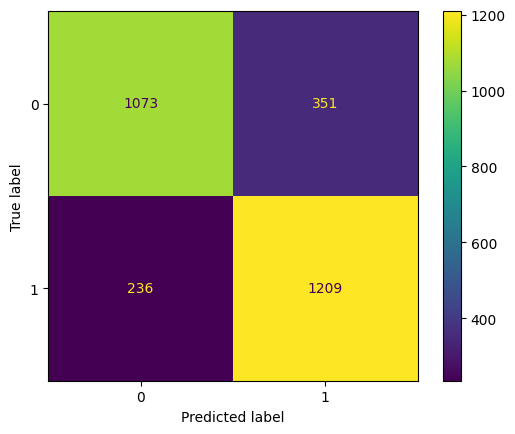

In [145]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

cm = confusion_matrix(Y_test,y_ts)
display = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)

display.plot()
display.show()

In [132]:
from sklearn.metrics import recall_score

c = recall_score(Y_train,y_tr)
d = recall_score(Y_test,y_ts)

print("Повнота(recall) для навчальної множини:", c)
print("Повнота(recall) для тестової множини:", d)

Повнота(recall) для навчальної множини: 0.8786225707466757
Повнота(recall) для тестової множини: 0.8366782006920416


In [133]:
from sklearn.metrics import f1_score

e = f1_score(Y_train, y_tr)
f = f1_score(Y_test, y_ts)

print ("Міра F1 (F1_score) для навчальної множини:", e)
print("Міра F1 (F1_score) для тестової множини:", f)

Міра F1 (F1_score) для навчальної множини: 0.8557197409928606
Міра F1 (F1_score) для тестової множини: 0.8046589018302829


Text(0.5, 1.0, 'Крива точності-повноти (precision-recall (PR) curve) для навчальної множини')

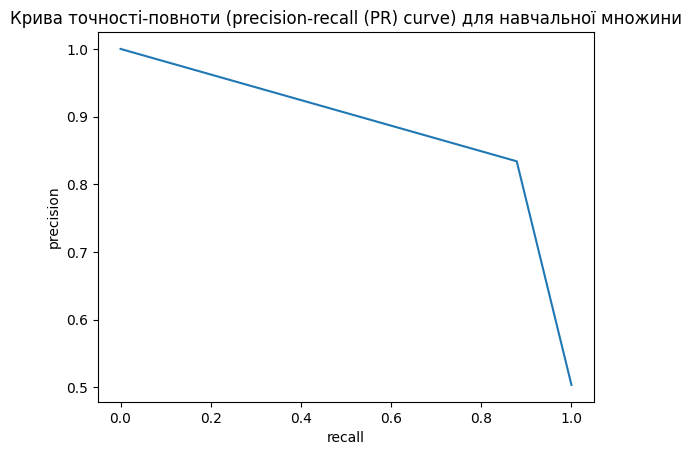

In [137]:
from sklearn.metrics import precision_recall_curve

precision,recall,thresholds = precision_recall_curve(Y_train,y_tr)

plt.plot(recall,precision)
plt.xlabel('recall')
plt.ylabel('precision')
plt.title('Крива точності-повноти (precision-recall (PR) curve) для навчальної множини')


Text(0.5, 1.0, 'Крива точності-повноти (precision-recall (PR) curve) для тестових даних')

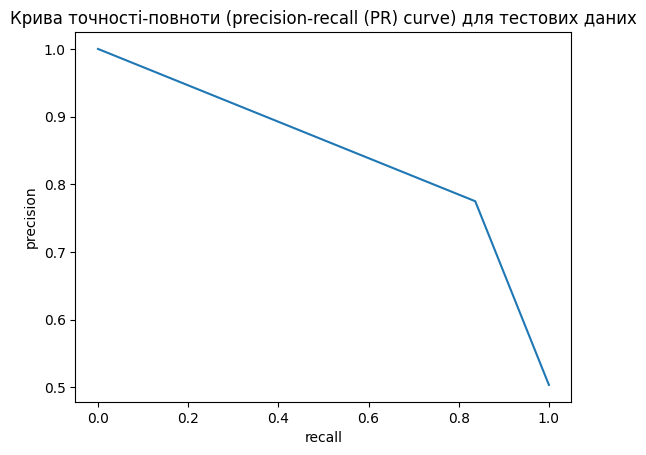

In [139]:


precision,recall,thresholds = precision_recall_curve(Y_test,y_ts)

plt.plot(recall,precision)
plt.xlabel('recall')
plt.ylabel('precision')
plt.title('Крива точності-повноти (precision-recall (PR) curve) для тестових даних')


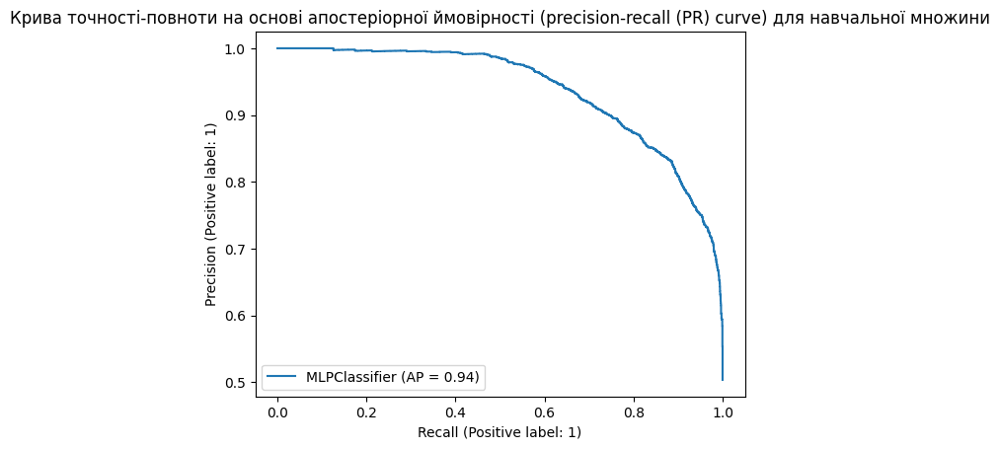

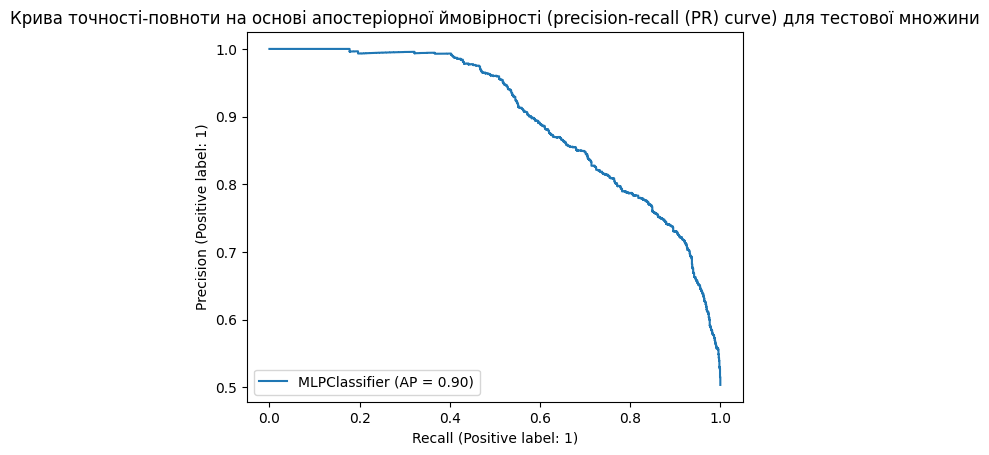

In [140]:
from sklearn.metrics import PrecisionRecallDisplay
predict_proba = clf.predict_proba(X_train)[:, 1]
display = PrecisionRecallDisplay.from_predictions(Y_train, predict_proba, name="MLPClassifier")
plt.title('Крива точності-повноти на основі апостеріорної ймовірності (precision-recall (PR) curve) для навчальної множини')
plt.show()
predict_proba = clf.predict_proba(X_test)[:, 1]
display = PrecisionRecallDisplay.from_predictions(Y_test, predict_proba, name="MLPClassifier")
plt.title('Крива точності-повноти на основі апостеріорної ймовірності (precision-recall (PR) curve) для тестової множини')
plt.show()


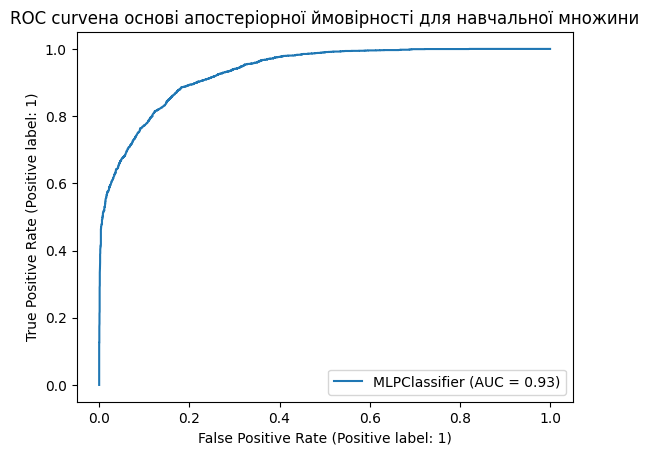

In [142]:
from sklearn.metrics import RocCurveDisplay
predict_proba = clf.predict_proba(X_train)[:, 1]
display = RocCurveDisplay.from_predictions(Y_train, predict_proba, name = "MLPClassifier")
display.ax_.set_title("ROC curveна основі апостеріорної ймовірності для навчальної множини")
plt.show() 

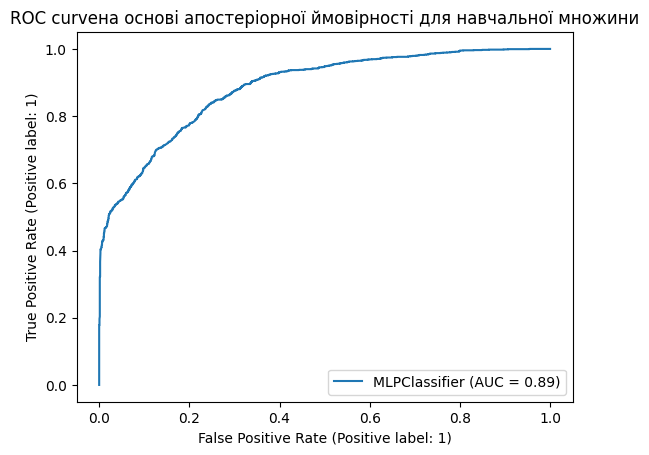

In [143]:
predict_proba = clf.predict_proba(X_test)[:, 1]
display = RocCurveDisplay.from_predictions(Y_test, predict_proba, name = "MLPClassifier")
display.ax_.set_title("ROC curveна основі апостеріорної ймовірності для навчальної множини")
plt.show() 